# Image Preprocessing Pipeline

This notebook reads an image from a provided path, then performs the following steps:

1. Display the original image
2. Convert to grayscale
3. Smooth the image using Gaussian Blur
4. Detect edges using Canny
5. Thin lines using skeletonization

Each step is displayed for visual inspection.


In [1]:
import os
import sys
import subprocess

import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage.morphology import skeletonize
from spatialmath import SE3

plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["image.cmap"] = "gray"


def show_image(title, image, cmap=None):
    plt.figure()
    plt.imshow(image, cmap=cmap)
    plt.title(title)
    plt.axis("off")
    plt.show()


def ensure_image_processing_dependencies():
    missing = []
    try:
        import cv2  # noqa: F401
    except ImportError:
        missing.append("opencv-python-headless")
    try:
        from skimage.morphology import skeletonize  # noqa: F401
    except ImportError:
        missing.append("scikit-image")
    try:
        import spatialmath  # noqa: F401
    except ImportError:
        missing.append("spatialmath-python")

    if missing:
        subprocess.check_call([sys.executable, "-m", "pip", "install", *missing])


ensure_image_processing_dependencies()


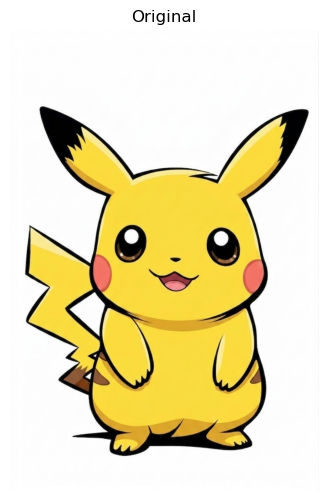

In [2]:
# Đổi đường dẫn này sang ảnh của bạn khi cần.
image_path = r"C:\Users\LEGION\Documents\GitHub\ur5e_painting\imgs\pikachu.jpg"

if not os.path.exists(image_path):
    raise FileNotFoundError(f"Không tìm thấy ảnh: {image_path}")

image_bgr = cv2.imread(image_path)
if image_bgr is None:
    raise ValueError(f"Không thể đọc ảnh từ path: {image_path}")

image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)
show_image("Original", image_rgb)


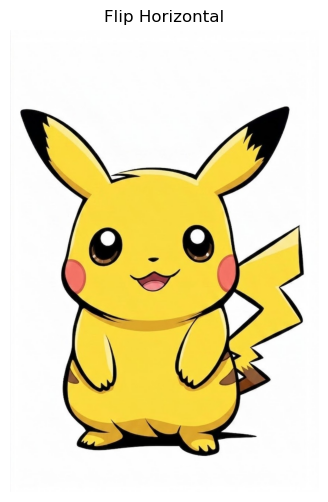

In [3]:
flipped_img = cv2.flip(image_rgb, 1)
show_image("Flip Horizontal", flipped_img)

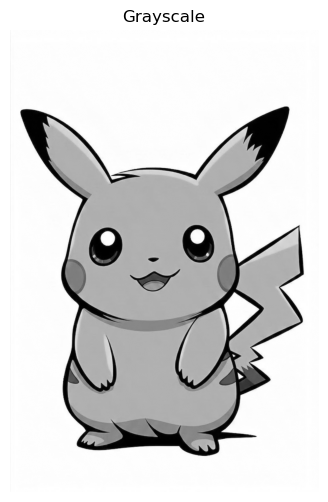

In [4]:
gray = cv2.cvtColor(flipped_img, cv2.COLOR_BGR2GRAY)
show_image("Grayscale", gray)


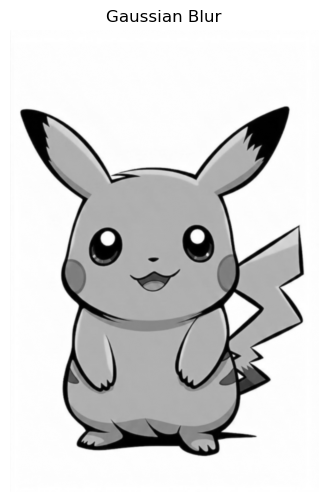

In [5]:
blurred = cv2.GaussianBlur(gray, (5, 5), 0)
show_image("Gaussian Blur", blurred)


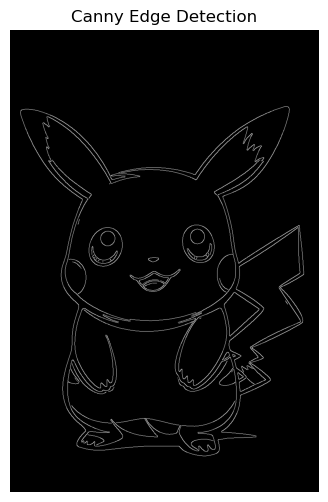

In [6]:
edges = cv2.Canny(blurred, 80, 100)
show_image("Canny Edge Detection", edges)


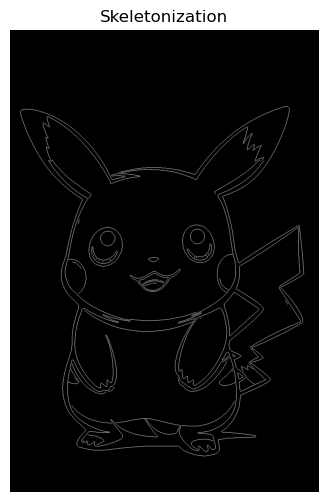

In [7]:
edge_binary = edges > 0
skeleton = skeletonize(edge_binary)
show_image("Skeletonization", skeleton, cmap="gray")


## 2. Đơn giản hóa đường cong (Polyline Simplification)

Sau khi có các pixel nét vẽ, ta chuyển chúng thành contour rồi dùng Douglas-Peucker (RDP) để giảm số lượng điểm trên mỗi đường cong.

- Epsilon nhỏ: giữ nhiều điểm hơn, nét mượt và chi tiết hơn.
- Epsilon lớn: giảm mạnh số điểm, đường thẳng hóa nhiều hơn và robot vẽ nhanh hơn.

Found 85 contours


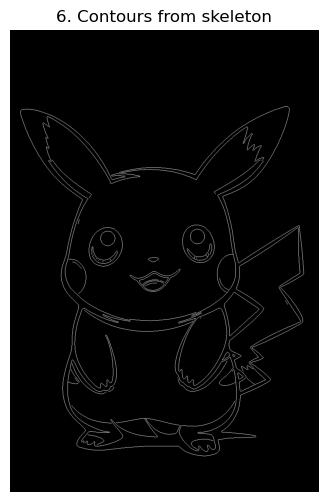

In [8]:
skeleton_u8 = (skeleton.astype(np.uint8) * 255)

# contours_input = edges.copy()  # Use the edges image as input for contour detection
contours_input = skeleton_u8  # Use the skeletonized image as input for contour detection

contours, hierarchy = cv2.findContours(contours_input, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
print(f'Found {len(contours)} contours')

contour_canvas = np.zeros_like(image_rgb)
cv2.drawContours(contour_canvas, contours, -1, (255, 255, 255), 1)
show_image('6. Contours from skeleton', contour_canvas)


## Simplify contour by Douglas-Peucker (RDP) algorithm

epsilon=0.5: 14645 -> 7045 points
epsilon=2.0: 14645 -> 1197 points
epsilon=5.0: 14645 -> 774 points
epsilon=20.0: 14645 -> 426 points


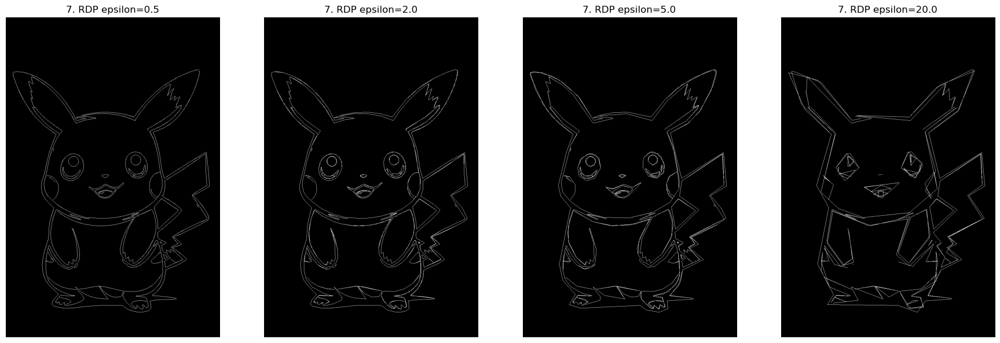

In [9]:
def simplify_contours_with_rdp(contours, epsilon):
    simplified = []
    for contour in contours:
        if len(contour) < 3:
            continue
        approx = cv2.approxPolyDP(contour, epsilon, False)
        simplified.append(approx)
    return simplified

epsilons = [0.5, 2.0, 5.0, 20.0]
simplified_sets = []

for epsilon in epsilons:
    simplified = simplify_contours_with_rdp(contours, epsilon)
    simplified_sets.append((epsilon, simplified))
    original_points = sum(len(contour) for contour in contours)
    simplified_points = sum(len(contour) for contour in simplified)
    print(f'epsilon={epsilon}: {original_points} -> {simplified_points} points')

fig, axes = plt.subplots(1, len(epsilons), figsize=(18, 6))
if len(epsilons) == 1:
    axes = [axes]

for ax, (epsilon, simplified) in zip(axes, simplified_sets):
    canvas = np.zeros_like(image_rgb)
    cv2.drawContours(canvas, simplified, -1, (255, 255, 255), 1)
    ax.imshow(canvas)
    ax.set_title(f'7. RDP epsilon={epsilon}')
    ax.axis('off')

plt.tight_layout()
plt.show()

Ignoring fixed y limits to fulfill fixed data aspect with adjustable data limits.


Image size: 843x1264 px
Scale factor: 0.1645 mm/px
Number of paths: 77
Example point (mm): x=89.70, y=184.05


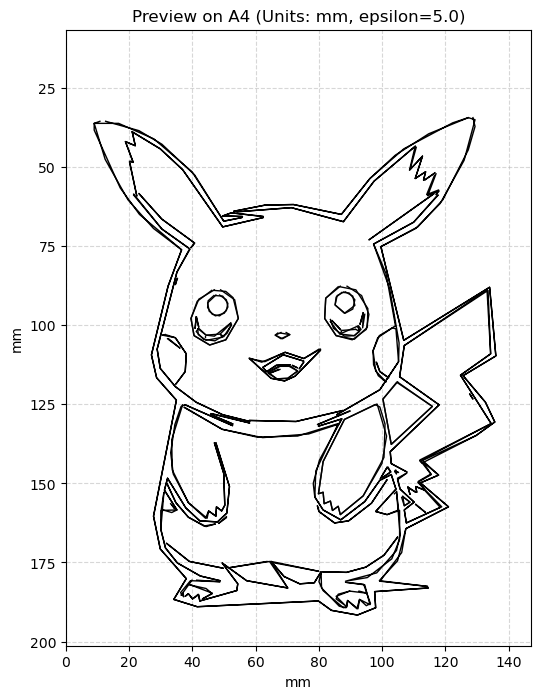

In [ ]:
# Kích thước chuẩn A4 (mm)
ratio = 0.7
A4_WIDTH = 210 * ratio
A4_HEIGHT = 297 * ratio

def convert_pixels_to_mm(contours, img_h, img_w):
    """
    Scale contours from pixels to mm to fit A4 paper.
    """
    # Xác định hướng giấy dựa trên hướng ảnh
    if img_w > img_h:
        paper_w, paper_h = A4_HEIGHT, A4_WIDTH # Landscape
    else:
        paper_w, paper_h = A4_WIDTH, A4_HEIGHT # Portrait
    
    # Tính tỷ lệ scale (giữ nguyên aspect ratio)
    scale = min(paper_w / img_w, paper_h / img_h)
    
    # Tính khoảng offset để căn giữa ảnh trên giấy (tùy chọn)
    offset_x = (paper_w - img_w * scale) / 2
    offset_y = (paper_h - img_h * scale) / 2
    
    contours_mm = []
    for cnt in contours:
        # cnt có shape (N, 1, 2)
        cnt_mm = cnt.astype(np.float32) * scale
        cnt_mm[:, :, 0] += offset_x # x direction
        cnt_mm[:, :, 1] += offset_y # y direction
        contours_mm.append(cnt_mm)
        
    return contours_mm, scale

# Lấy bộ contour đã rút gọn với epsilon = 2.0 (hoặc chọn cái bạn ưng ý)
chosen_epsilon = 2.0
_, simplified_contours = next((s for s in simplified_sets if s[0] == chosen_epsilon), simplified_sets[1])

img_h, img_w = gray.shape
contours_mm, scale_factor = convert_pixels_to_mm(simplified_contours, img_h, img_w)

print(f"Image size: {img_w}x{img_h} px")
print(f"Scale factor: {scale_factor:.4f} mm/px")
print(f"Number of paths: {len(contours_mm)}")

# Kiểm tra tọa độ điểm đầu tiên của contour đầu tiên
if contours_mm:
    example_pt = contours_mm[0][0][0]
    print(f"Example point (mm): x={example_pt[0]:.2f}, y={example_pt[1]:.2f}")

# Vẽ minh họa trên tọa độ mm
plt.figure(figsize=(6, 8))
for cnt in contours_mm:
    pts = cnt.reshape(-1, 2)
    plt.plot(pts[:, 0], pts[:, 1], 'black', linewidth=1)

plt.title(f"Preview on A4 (Units: mm, epsilon={chosen_epsilon})")
plt.xlabel("mm")
plt.ylabel("mm")
plt.gca().invert_yaxis() # Để y hướng xuống giống hệ tọa độ ảnh
plt.axis("equal")
plt.xlim(0, A4_WIDTH if img_w < img_h else A4_HEIGHT)
plt.ylim(A4_HEIGHT if img_w < img_h else A4_WIDTH, 0)
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


## 4. Kiểm tra mật độ điểm (Scatter Plot)

Để kiểm tra xem thuật toán RDP đã lược bỏ bao nhiêu điểm và độ bao phủ của các điểm còn lại như thế nào, chúng ta sẽ vẽ dưới dạng **Scatter Plot** thay vì nối các đoạn thẳng. Điều này giúp hình dung rõ các vị trí robot sẽ thực sự "nhắm" tới.


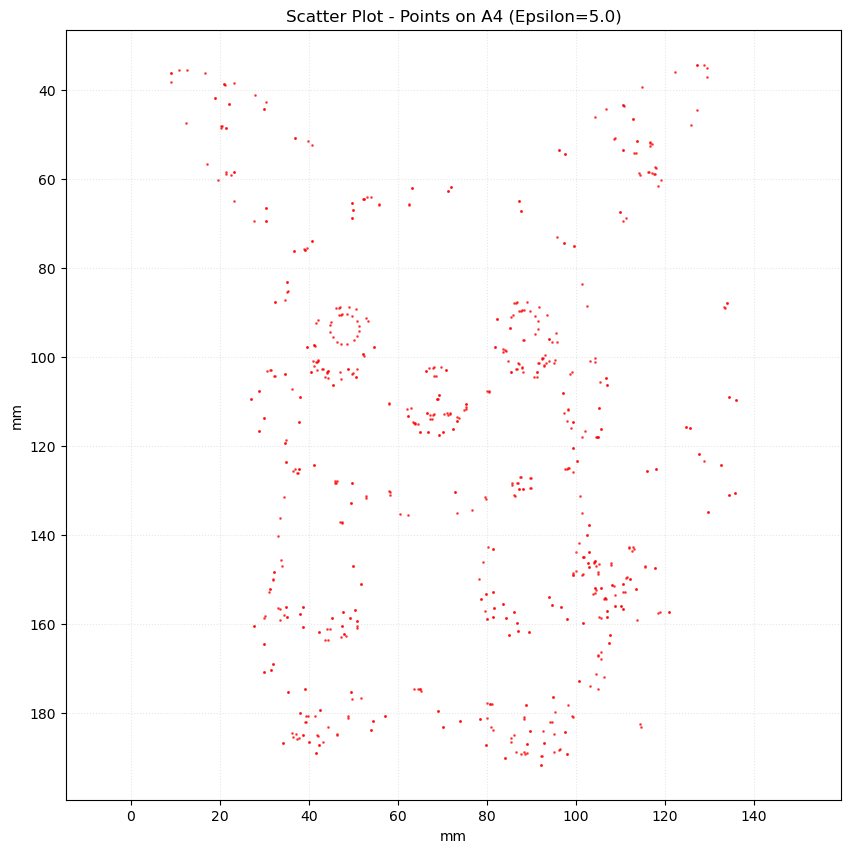

Tổng số điểm robot sẽ di chuyển qua: 774


In [11]:
# Vẽ scatter plot để xem mật độ điểm thực tế
plt.figure(figsize=(10, 10))

for cnt in contours_mm:
    pts = cnt.reshape(-1, 2)
    plt.scatter(pts[:, 0], pts[:, 1], s=1, c='red', alpha=0.6)

plt.title(f"Scatter Plot - Points on A4 (Epsilon={chosen_epsilon})")
plt.xlabel("mm")
plt.ylabel("mm")
plt.gca().invert_yaxis()
plt.axis("equal")
plt.grid(True, linestyle=':', alpha=0.3)
plt.show()

print(f"Tổng số điểm robot sẽ di chuyển qua: {sum(len(c) for c in contours_mm)}")


## 5. Mô phỏng quá trình vẽ (Animation)

Để kiểm tra thứ tự các nét vẽ và tốc độ dự kiến của robot, chúng ta tạo một animation mô phỏng lại quá trình vẽ từng điểm một.


In [12]:
import matplotlib.animation as animation
from IPython.display import HTML

def animate_robot_drawing(contours_mm, img_w, img_h) -> HTML:
    # Chuẩn bị dữ liệu: Nối các contour lại và dùng NaN để ngắt quãng nét vẽ
    all_pts = []
    for cnt in contours_mm:
        pts = cnt.reshape(-1, 2)
        all_pts.append(pts)
        all_pts.append(np.array([[np.nan, np.nan]])) # Thêm điểm chết để ngắt nét khi vẽ

    plot_data = np.vstack(all_pts)

    fig, ax = plt.subplots(figsize=(6, 8))
    line, = ax.plot([], [], 'black', lw=1.5)

    # Cấu hình trục tọa độ mm
    ax.set_xlim(0, A4_WIDTH if img_w < img_h else A4_HEIGHT)
    ax.set_ylim(A4_HEIGHT if img_w < img_h else A4_WIDTH, 0) # Invert Y
    ax.set_aspect('equal')
    ax.set_title("Robot Drawing Simulation (mm)")
    ax.grid(True, linestyle=':', alpha=0.3)

    def init():
        line.set_data([], [])
        return line,

    def update(frame):
        # Vẽ dần dần từ điểm 0 đến 'frame'
        current_data = plot_data[:frame]
        line.set_data(current_data[:, 0], current_data[:, 1])
        return line,

    # Giới hạn số frame để animation không quá nặng (VD: lấy mỗi n điểm)
    step = max(1, len(plot_data) // 200) 
    frames = range(0, len(plot_data), step)

    ani = animation.FuncAnimation(fig, update, frames=frames, init_func=init, 
                                blit=True, interval=20)

    # Hiển thị animation dưới dạng video HTML
    plt.close() # Đóng plot tĩnh để tránh hiện 2 hình
    return HTML(ani.to_jshtml())

animate_robot_drawing(contours_mm, img_w, img_h)


## 6. Tối ưu hóa thứ tự vẽ (Path Optimization)

Để giảm thời gian di chuyển không tải (air time) của robot, chúng ta cần sắp xếp lại thứ tự các contour sao cho điểm kết thúc của một nét gần nhất với điểm bắt đầu của nét tiếp theo. Chúng ta sẽ sử dụng thuật toán **Greedy** (tham lam).


In [13]:
def calculate_air_distance(contours):
    """
    Tính tổng quãng đường 'nhấc bút' di chuyển giữa các đường nét.
    """
    total_dist = 0
    for i in range(len(contours) - 1):
        end_pt = contours[i][-1][0]
        start_pt = contours[i+1][0][0]
        dist = np.linalg.norm(end_pt - start_pt)
        total_dist += dist
    return total_dist

def optimize_path_greedy(contours):
    """
    Sắp xếp lại thứ tự các contour để giảm thiểu quãng đường di chuyển không tải.
    Đồng thời lật ngược contour nếu điểm kết thúc gần hơn điểm bắt đầu.
    """
    if not contours:
        return []

    unvisited = list(contours)
    optimized = []
    
    # Bắt đầu từ nét vẽ đầu tiên
    current_cnt = unvisited.pop(0)
    optimized.append(current_cnt)
    
    while unvisited:
        last_pt = optimized[-1][-1][0]
        
        best_idx = -1
        min_dist = float('inf')
        should_flip = False
        
        for i, cnt in enumerate(unvisited):
            # Khoảng cách tới điểm đầu
            d_start = np.linalg.norm(last_pt - cnt[0][0])
            # Khoảng cách tới điểm cuối (sau đó sẽ lật ngược)
            d_end = np.linalg.norm(last_pt - cnt[-1][0])
            
            if d_start < min_dist:
                min_dist = d_start
                best_idx = i
                should_flip = False
            
            if d_end < min_dist:
                min_dist = d_end
                best_idx = i
                should_flip = True
        
        next_cnt = unvisited.pop(best_idx)
        if should_flip:
            next_cnt = np.flip(next_cnt, axis=0)
        
        optimized.append(next_cnt)
        
    return optimized

# Tính quãng đường cũ
old_air_dist = calculate_air_distance(contours_mm)
print(f"Quãng đường di chuyển không tải cũ: {old_air_dist:.2f} mm")

# Tối ưu hóa
optimized_contours_mm = optimize_path_greedy(contours_mm)

# Tính quãng đường mới
new_air_dist = calculate_air_distance(optimized_contours_mm)
print(f"Quãng đường di chuyển không tải mới: {new_air_dist:.2f} mm")
if old_air_dist > 0:
    print(f"Cải thiện: {((old_air_dist - new_air_dist) / old_air_dist * 100):.1f}%")

# Cập nhật contours_mm để các bước sau dùng bản đã tối ưu
contours_mm = optimized_contours_mm

Quãng đường di chuyển không tải cũ: 2730.53 mm
Quãng đường di chuyển không tải mới: 733.39 mm
Cải thiện: 73.1%


## 7. Nội suy và Tái lấy mẫu đường quỹ đạo (Trajectory Resampling)

Để robot di chuyển mượt mà và ổn định, ta cần đảm bảo các điểm trên quỹ đạo có khoảng cách đều nhau. Ta sẽ thực hiện resampling dựa trên một khoảng cách ngưỡng (threshold) tính bằng mm.


Tham số threshold: 5.0 mm
Số lượng điểm gốc: 774
Số lượng điểm sau Numpy (Linear): 1175


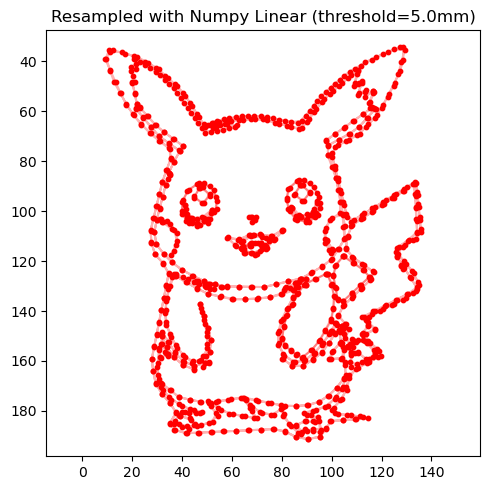

In [14]:
def resample_with_numpy(contours, threshold_mm):
    """
    Resampling quỹ đạo sử dụng np.interp (Linear)
    """
    resampled_contours = []
    
    for cnt in contours:
        pts = cnt.reshape(-1, 2)
        if len(pts) < 2:
            resampled_contours.append(cnt)
            continue
            
        dists = np.sqrt(np.sum(np.diff(pts, axis=0)**2, axis=1))
        cumulative_dist = np.insert(np.cumsum(dists), 0, 0)
        total_dist = cumulative_dist[-1]
        
        if total_dist < threshold_mm:
            resampled_contours.append(cnt)
            continue
            
        num_points = int(np.ceil(total_dist / threshold_mm)) + 1
        new_dist = np.linspace(0, total_dist, num_points)
        
        # Nội suy sử dụng numpy
        new_x = np.interp(new_dist, cumulative_dist, pts[:, 0])
        new_y = np.interp(new_dist, cumulative_dist, pts[:, 1])
        
        new_pts = np.vstack((new_x, new_y)).T
        resampled_contours.append(new_pts.reshape(-1, 1, 2).astype(np.float32))
        
    return resampled_contours

# Cấu hình tham số resampling
RESAMPLE_THRESHOLD = 5.0 # mm

contours_numpy = resample_with_numpy(contours_mm, RESAMPLE_THRESHOLD)

# Thống kê số lượng điểm
original_pts_count = sum(len(c) for c in contours_mm)
numpy_pts_count = sum(len(c) for c in contours_numpy)

print(f"Tham số threshold: {RESAMPLE_THRESHOLD} mm")
print(f"Số lượng điểm gốc: {original_pts_count}")
print(f"Số lượng điểm sau Numpy (Linear): {numpy_pts_count}")

# Trực quan hóa so sánh một đoạn nhỏ
plt.figure(figsize=(5, 5))
for cnt in contours_numpy:
    pts = cnt.reshape(-1, 2)
    plt.plot(pts[:, 0], pts[:, 1], 'r-', alpha=0.3)
    plt.scatter(pts[:, 0], pts[:, 1], s=10, c='red')

plt.title(f"Resampled with Numpy Linear (threshold={RESAMPLE_THRESHOLD}mm)")
plt.gca().invert_yaxis()
plt.axis('equal')

plt.tight_layout()
plt.show()

contours_mm = contours_numpy 


In [15]:
%store contours_mm

Stored 'contours_mm' (list)
